In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
import tadat
import tadat.core 
from tadat.pipeline import plots
from matplotlib import colors
from matplotlib import pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc
import pandas as pd

In [12]:

def plot_heatmap(data,labels,classes=None,legend=True,ax=None,title=None):    
    color_dic = {"depression":"steelblue", "control":"lightgray", "ptsd":"firebrick"}
    color_dic = {"1':"steelblue", "0":"lightgray", "3":"firebrick"}
    cols = {u:color_dic[c] for u,c in labels.items()}   
    # Creates a new figure
    if ax is None:
        fig,ax = plt.subplots(1,1,figsize=(12,6))    
    cvr = colors.ColorConverter()
    tmp = sorted(cols.keys())
    cols_rgb = [cvr.to_rgb(cols[k]) for k in tmp]
    intervals = np.array(tmp + [tmp[-1]+1])
    cmap, norm = colors.from_levels_and_colors(intervals,cols_rgb)
    ax.pcolor(data,cmap = cmap, norm = norm)
    plt.xlim(0,data.shape[1]+5)
    plt.xticks([], [])

    max_y = data.shape[0]+17
    plt.ylim(0,max_y)
    #number of users per class
    slice_size=data.shape[1]/len(classes)

    for i,c in enumerate(classes):
        x=(slice_size*i)+(slice_size/2)
        ax.annotate(c,(x,data.shape[0]+5),color="k",size=10)

def roc_ranking(user_ranking, user_labels, sim_scores, pos_class, ax=None, col=None,
                title=None, no_xticks=False, no_yticks=False):
    #user_labels[966]="control"
    #f,ax = plt.subplots(1,1,figsize=(20,10))
    color_dic = {"depression":"steelblue", "control":"lightgray", "ptsd":"firebrick"}
    color_dic = {"1":"steelblue", "0":"lightgray", "2":"firebrick"}
    if not col:
        col = color_dic[pos_class]
    if ax is None:
        fig,ax = plt.subplots(1,1,figsize=(10,10))    
    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='k')
    mean_tpr = 0.0
    mean_fpr = np.linspace(0, 1, 100)
    n_users=0
    for i in range(user_ranking.shape[1]):    
        rank = user_ranking[:,i]
        sim = sim_scores[:,i]
        user_idx = rank[0] 
        user_label = user_labels[user_idx]
        others_labels = [1 if user_labels[int(x)] == user_label else 0 for x in rank ]        
        set_trace()
        if user_label != pos_class:
            continue
        else:
            n_users+=1
        fpr, tpr, thresholds = roc_curve(others_labels, sim, drop_intermediate=True)
        mean_tpr += np.interp(mean_fpr, fpr, tpr)
        mean_tpr[0] = 0.0
        ax.plot(fpr, tpr, lw=0.1,color=col)
    set_trace()
    mean_tpr /= n_users
    mean_tpr[-1] = 1.0
    au = auc(mean_fpr, mean_tpr)
    ax.plot(mean_fpr, mean_tpr, lw=3, color=col,label=pos_class + "\nAUC: %.2f" % au)
    if no_xticks: 
        ax.set_xticks([])
    else:
        ax.set_xticks([0.2,0.4,0.6,0.8])
    if no_yticks: 
        ax.set_yticks([])
    else:
        ax.set_yticks([0.2,0.4,0.6,0.8])
    ax.legend(loc='lower right', shadow=True)
    if title is not None:
        ax.set_title(title)
    return au

def sort_and_subsample(user_labels, max_users_class=None):
    label_set = set(user_labels.values())
    # order the users per class and subsample to have the same number of users per class
    labels_users = {l:[] for l in label_set}
    for u,l in user_labels.items(): labels_users[l].append(u)
    if not max_users_class:
        max_users_class = min([ len(labels_users[l]) for l in label_set])
    print("[max users/class: {}]".format(max_users_class))
    user_idxs = []
    for l in label_vocab.keys(): user_idxs += labels_users[l][:max_users_class]
    
    return user_idxs 


In [5]:
dataset="DATA/input/IHM_train.csv"
df = pd.read_csv(dataset, sep="\t")
df = df.drop_duplicates(subset=['SUBJECT_ID'])
users = df["SUBJECT_ID"].tolist()
labels = [str(y) for y in df["Y"].tolist()]
# users = []
# with open(dataset) as fi:
#     lines = fi.readlines()[1:]
# users = [l.split()[0] for l in lines if len(l.strip()) > 0]
# labels = [l.split()[1] for l in lines if len(l.strip()) > 0]
user_vocab = {str(u):i for i,u in enumerate(users)}
label_vocab = {l:i for i,l in enumerate(set(labels))}
labels_idx = [ label_vocab[l] for l in labels]
#the labels are ordered 
user_labels = {i:labels[i] for i, _ in enumerate(users) }
user_idxs = sort_and_subsample(user_labels, 200)
# len(set(users))
# user_vocab

[max users/class: 200]


In [7]:
U_path = "DATA/features/U.txt"
U = tadat.core.embeddings.read_embeddings(U_path, user_vocab)
U_p = tadat.core.embeddings.project_vectors(U.T, model="tsne", N=2, perp=60)

0/9770 (0.00 %) words in vocabulary found no embedding


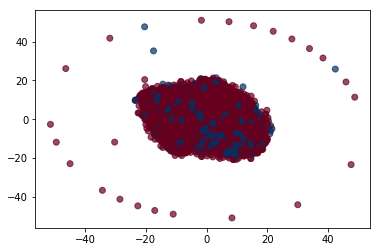

In [8]:
U_p.shape
plots.plot_projection(U_p, labels=labels_idx, label_dict=label_vocab)

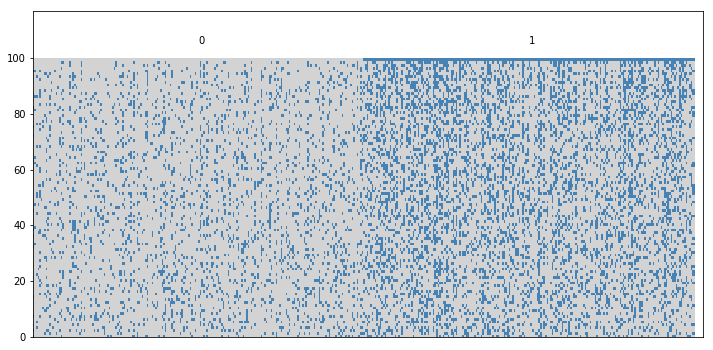

In [13]:
ranking, scores = tadat.core.embeddings.similarity_rank(U,user_idxs,100)
flp_rank = np.flipud(ranking)
plot_heatmap(flp_rank, user_labels, label_vocab)

0.5570097150460871

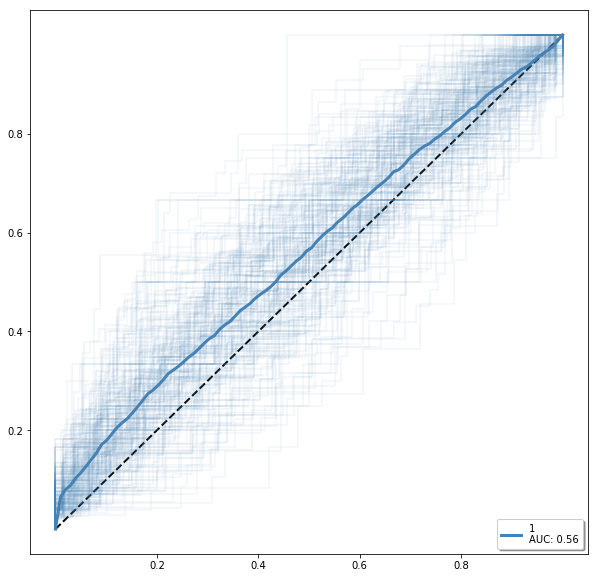

In [14]:
roc_ranking(ranking, user_labels, scores, "1")